## Wild Animal Detection ML Flow

#### 🧭 Work Flow Contents
- [Step 1. Setup Libraries](https://adb-3709817011292929.9.azuredatabricks.net/editor/notebooks/3114501104424549?o=3709817011292929#command/8297806408689085)
- [Step 2. Load Manifest Table with File Size](https://adb-3709817011292929.9.azuredatabricks.net/editor/notebooks/3114501104424549?o=3709817011292929#command/8297806408689081)
- [Step 3. Add TM indicator](#2-load-dataset)
- [Step 4. Apply Megadtector v5 binary model on pre-processing filtered out images](#3-model-training)
- [Step 5. Run Megadetector Stack models on included images](#4-model-evaluation)
- [Step 6. Output to JSON/Manifest Table](#4-model-evaluation)

### Step 1. Setup Libraries

In [0]:
#%pip install megadetector
#%pip install dbutils
#%pip install yolov5
#%pip install torch 
#%pip install torchvision
# %pip install numpy==1.26.4
# %pip install supervision
# %pip install lightning
# %pip install omegaconf
#%pip install ultralytics
%pip install torch
%pip install ultralytics
%pip install pytesseract
%pip install config
%pip install yolov5
%pip install faiss-cpu
#%pip install faiss-cpu

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/62.0 kB ? eta -:--:--
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.4 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of contourpy to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/1.1 MB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 1.1/1.1 MB 45.3 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/67.0 MB ? eta -:--:--
   ━╸━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/67.0 MB 76.9 MB/s eta 0:00:01
   ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/67.0 MB 69.2 MB/s eta 0:00:01
   ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/67.0 MB 69.2 MB/s eta 0:00:01
   ━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/67.0

In [0]:

# if incompatable issue occured, run commands below
%pip uninstall -y pandas numpy pyarrow
%pip install pandas==2.2.2 numpy==1.26.4 pyarrow==15.0.2
dbutils.notebook.exit(None)


In [0]:
 dbutils.library.restartPython()
 

In [0]:
#always needed
import config
import os
import pandas as pd
import torch #GPU version
import numpy as np
import io

#data preprocessing librariesa
import cv2,pytesseract
from PIL import Image,ImageStat
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql import Row

from pyspark.sql.functions import col, input_file_name, lit, current_timestamp, split, element_at, regexp_extract
from pyspark.sql.functions import col, substring, length
from pyspark.sql.types import StructType, StructField, IntegerType,BooleanType, FloatType, StringType,BinaryType,LongType, TimestampType
from pyspark.sql.functions import sha2, expr
from pyspark.sql.functions import hash as spark_hash, pmod
from pyspark.sql.functions import pandas_udf, PandasUDFType
from pyspark.sql.functions import udf
from delta.tables import DeltaTable

#model related libraries
from ultralytics import YOLO #for YOLOv9
from pathlib import Path

#others
import requests # Define the URL and the local file path
import json
from datetime import datetime
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [0]:
# expand full error message
spark.conf.set("spark.sql.logging.level", "ERROR")

In [0]:
# define the year of photoes for table names
photo_year="2024"

# schema of the output
schema= "meadowbank_prod"

# define output of this model's name and location, ex. md24v6 then final table will be 
process_name="md24_tws"

# Volume root path
volume_root = "/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/"

# designated folder for animal output images
output_uc_folder="/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/results/2024_TWS/wildlife_test/"

########################################################no need to modify anything below unless have to#####################################################
# manifest table destination
manifest_table=f"{schema}.remote_cameras.{process_name}_manifest_{photo_year}"

manifest_timestamp_table=f"{schema}.remote_cameras.{process_name}_manifest_timestamp_{photo_year}"

tm_target_table = f"{schema}.remote_cameras.{process_name}_tm_indicator_{photo_year}"

# includes the group_id indicate neighbotimages
manfiest_table_grouped=f"{schema}.remote_cameras.{process_name}_manifest_grouped_{photo_year}"

model_table=f"{schema}.remote_cameras.{process_name}_megadetector_model_{photo_year}"

#includes final model output from two models
model_output_table=f"{schema}.remote_cameras.{process_name}_megadetector_v5a_v6byolo9c_results_{photo_year}"

manifest_table_final=f"{schema}.remote_cameras.{process_name}_manifest_{photo_year}_final"

# ------------------- Model Config ------------------- #
model_path_yolo10e = "/dbfs/FileStore/models/MDV6-yolov10-e.pt"
model_path_md5a = "/dbfs/FileStore/models/MDV6-mg5a.pt"

yolo10e_output_table = f"{schema}.remote_cameras.{process_name}_model_output_binary_yolov10e"
mg5a_binary_output_table = f"{schema}.remote_cameras.{process_name}_binary_preprocessing_mg5a"
mg5a_output_table = f"{schema}.remote_cameras.{process_name}_model_output_mg5a"
yolo9c_output_table = f"{schema}.remote_cameras.{process_name}_model_output_yolo9c"

# manifest final output table for final_category to classify images
animal_confidence_threshold=0.5
vehicle_confidence_threshold=0.3
human_confidence_threshold=0.3

### **Step 2. Load Manifest Table**

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, round

spark = SparkSession.builder.getOrCreate()

# Read only metadata (no image content)
df_manifest = (
    spark.read.format("binaryFile")
    .option("pathGlobFilter", "*.JPG")
    .option("recursiveFileLookup", "true")
    .load(volume_root)
    .select(
        col("path").alias("image_path"),
        round(col("length") / 1024, 2).alias("file_size_kb")  # convert bytes → KB
    )
)

df_manifest.show(5, truncate=False)
print(f"Total images detected: {df_manifest.count():,}")


In [0]:
from pyspark.sql.functions import col

# Write manifest table to Catalog Volume (only valid rows)
df_manifest.write.format("delta") \
    .mode("overwrite") \
    .saveAsTable(manifest_table)

print(f"✅ Manifest table written with {df_manifest.count():,} valid rows (file_size_kb > 0)")


### Step 3. Add TM indicator

In [0]:
# load the manifest table
df = spark.sql(f"select * from {manifest_table}")

In [0]:
# identify all the images camera folder
df = df.withColumn(
    "camera_folder",
    F.regexp_extract(F.col("image_path"), r"(Camera \d+)", 1)
)

In [0]:
import os
from pyspark.sql.functions import col, length, lit

# === recursively list all date folders ===
def list_date_folders(base_path):
    """
    Recursively find all subfolders that match YYYY-MM-DD under each Camera folder.
    Works directly with Unity Catalog Volumes paths.
    """
    date_folders = []
    for root, dirs, files in os.walk(base_path):
        for d in dirs:
            # detect folder names like 2023-12-19
            if len(d) == 10 and d[:4].isdigit() and d[4] == "-" and d[7] == "-":
                date_folders.append(os.path.join(root, d))
    return sorted(date_folders)


In [0]:
# === Collect all date folders ===
date_folders = list_date_folders(volume_root)

print(f"📆 Found {len(date_folders)} date folder to process.")
#first part has 375 folders processed 1.8 million images
#second part has 296 folders
#Total 671 folders

📆 Found 671 date folder to process.


In [0]:
# ---------------- 3) EXTRACT METADATA ----------------

import re
from io import BytesIO
from PIL.ExifTags import TAGS


@pandas_udf("string")
def extract_exif_datetime(contents: pd.Series) -> pd.Series:
    out = []
    for data in contents:
        try:
            img = Image.open(BytesIO(data))
            exif_data = img.getexif()
            dt = None
            if exif_data:
                for tag_id, value in exif_data.items():
                    tag = TAGS.get(tag_id, tag_id)
                    if tag in ("DateTimeOriginal", "DateTimeDigitized", "DateTime"):
                        dt = value
                        break
            out.append(dt)
        except:
            out.append(None)
    return pd.Series(out)

pattern = re.compile(r"Camera\s*\d+", re.IGNORECASE)


In [0]:
import os
from pyspark.sql.functions import col, length, lit, to_timestamp, date_format, when

for folder in date_folders:
    print(f"\n🚀 Processing folder: {folder}")

    try:
        parts = folder.split("/")
        # camera_name = next((p for p in parts if p.startswith("Camera")), None)
        date_str = parts[-1]  # YYYY-MM-DD

        # 1) Load JPGs
        images = (
            spark.read.format("binaryFile")
            .option("recursiveFileLookup", "true")
            .option("pathGlobFilter", "*.JPG")
            .load(folder)   # folder must be dbfs:/Volumes/... path
            .select("path", "content")
            .filter(length(col("content")) > 0)
        )

        # 2) Extract EXIF timestamp
        images = images.withColumn("datetime_original", extract_exif_datetime(col("content")))

        # 3) Convert to timestamp safely
        images = images.withColumn(
            "capture_timestamp",
            to_timestamp("datetime_original", "yyyy:MM:dd HH:mm:ss")
        )

        # 4) Make T/M label
        images = images.withColumn("timestamp", date_format("capture_timestamp", "HH:mm:ss"))

        # T_TIMES = [f"{h:02d}:{m:02d}:00" for h in range(24) for m in (0, 30)]
        # images = images.withColumn(
        #     "tm_indicator",
        #     when(col("time_taken").isin(T_TIMES), "T").otherwise("M")
        # )

        # 5) Attach camera + date
        # images = images.withColumn("camera_name", lit(camera_name))
        images = images.withColumn("capture_date", lit(date_str))

        # ✅ 6) Select desired final columns
        result_df = images.select(
            "path",
            # "camera_name",
            "capture_date",
            "timestamp",      # <-- added
            # "tm_indicator"
        )

        # Save output
        result_df.write.format("delta") \
            .mode("append") \
            .option("overwriteSchema", "true") \
            .saveAsTable(manifest_timestamp_table)

        print(f"✅ Completed {date_str}")

    except Exception as e:
        print(f"⚠️ Skipped {folder} due to error: {e}")
        continue



🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19
✅ Completed 2023-12-19

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-01-16
✅ Completed 2024-01-16

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-01-24
✅ Completed 2024-01-24

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-02-06
✅ Completed 2024-02-06

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-02-15
✅ Completed 2024-02-15

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-02-20
✅ Completed 2024-02-20

🚀 Processing folder: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2024-02-25
✅ Completed 202

In [0]:
# from pyspark.sql.functions import pandas_udf, col
# from pyspark.sql.types import StringType
# import pandas as pd
# import numpy as np
# import cv2, pytesseract

# TOP_FRAC = 0.05
# CENTER_FRAC = 0.08
# RATIO_CUT = 1.05
# DENSITY_MIN = 0.0015

# @pandas_udf(StringType())
# def detect_tm_hybrid_udf(contents: pd.Series) -> pd.Series:
#     results = []
#     count = 0
#     for content in contents:
#         count += 1
#         if count % 1000 == 0:
#             print(f"✅ Processed {count} images in this partition")

#         try:
#             if content is None:
#                 results.append(None)
#                 continue
#             np_arr = np.frombuffer(content, np.uint8)
#             img = cv2.imdecode(np_arr, cv2.IMREAD_GRAYSCALE)
#             if img is None:
#                 results.append(None)
#                 continue

#             h, w = img.shape[:2]
#             y2 = int(TOP_FRAC * h)
#             x1, x2 = int((0.5 - CENTER_FRAC) * w), int((0.5 + CENTER_FRAC) * w)
#             roi = img[0:y2, x1:x2]
#             roi = cv2.equalizeHist(roi)
#             _, binary = cv2.threshold(roi, 180, 255, cv2.THRESH_BINARY_INV)

#             sobelx = cv2.Sobel(binary, cv2.CV_64F, 1, 0, ksize=3)
#             sobely = cv2.Sobel(binary, cv2.CV_64F, 0, 1, ksize=3)
#             ratio = np.sum(np.abs(sobelx)) / (np.sum(np.abs(sobely)) + 1e-5)
#             density = np.mean(binary > 0)
#             if density < DENSITY_MIN:
#                 results.append(None)
#                 continue

#             guess = "T" if ratio > RATIO_CUT else "M"
#             if 0.9 < ratio < 1.2:
#                 txt = pytesseract.image_to_string(roi, config="--psm 7 -c tessedit_char_whitelist=TM").strip()
#                 if "T" in txt:
#                     guess = "T"
#                 elif "M" in txt:
#                     guess = "M"
#             results.append(guess)
#         except Exception as e:
#             print(f"⚠️ Error: {e}")
#             results.append(None)

#     print(f"✅ Finished partition with {count} images")
#     return pd.Series(results)

In [0]:
# import os
# from pyspark.sql.functions import col, length

# print("📁 Previewing date folders:")
# for f in date_folders[:3]:
#     print(f" - {f}")
# print("...")

# # Main loop per date folder
# for folder in date_folders:
#     print(f"\n🚀 Processing folder: {folder}")
#     try:
#         # Load JPG images, only load metadata + binary
#         images = (
#             spark.read.format("binaryFile")
#             .option("recursiveFileLookup", "true")
#             .option("pathGlobFilter", "*.JPG")
#             .load(folder)
#             .select("path", "content")
#         )

#         # Drop invalid or empty images early
#         images = images.filter(length(col("content")) > 0)

#         # Skip empty folders to avoid wasted Spark job time
#         if images.rdd.isEmpty():
#             print(f"⚠️ Skipped (empty): {folder}")
#             continue

#         images = images.repartition(256)

#         # Apply TM detection UDF
#         result_df = images.withColumn(
#             "tm_indicator",
#             detect_tm_hybrid_udf(col("content"))
#         )

#         # Select only required columns before saving
#         result_df_no_content = result_df.select("path", "tm_indicator")

#         # Write results to target table with minimal overhead
#         result_df_no_content.write \
#             .format("delta") \
#             .mode("append") \
#             .option("mergeSchema", "true") \
#             .saveAsTable(tm_target_table)

#         print(f"✅ Completed: {folder}")

#     except Exception as e:
#         print(f"⚠️ Error in {folder}: {e}")
#         continue


### Step 4. Apply Megadtector v5 binary model on pre-processing filtered out image


In [0]:
from pyspark.sql import functions as F

df_ts = spark.sql(f"select * from {manifest_timestamp_table}")

df_ts = df_ts.withColumn(
    "TM_flag",
    F.when(F.col("timestamp").endswith("0:00"), "T").otherwise("M")
)

df_ts = df_ts.withColumnRenamed("path", "image_path")


In [0]:
df_join=df.join(df_ts, on='image_path')

In [0]:
df_join.show(5,truncate=False)

+--------------------------------------------------------------------------------------------------------------------+------------+------------+---------+-------+
|image_path                                                                                                          |file_size_kb|capture_date|timestamp|TM_flag|
+--------------------------------------------------------------------------------------------------------------------+------------+------------+---------+-------+
|dbfs:/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19/RCNX0007.JPG|103.87      |2023-12-19  |13:07:23 |M      |
|dbfs:/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19/RCNX0015.JPG|101.36      |2023-12-19  |14:04:55 |M      |
|dbfs:/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19/RCNX0026.JPG|99.57       |2023-12-19  |15:02:59 |M      |
|dbfs:/Volumes/meadowb

In [0]:
from pyspark.sql.functions import when, col

# add a column 'pre-filtered' with logic saying if file_size<105 or tm_indicator=='T' then 'True' else 'False'
df_pre_filtered= df_join.withColumn(
    "pre_filtered",
    when(
        (col("file_size_kb") < 105) | (col("TM_flag") == "T"),
        "True"
    ).otherwise("False")
)

In [0]:
# for waterfall analyses 
# df.filter(col("file_size_kb") < 105).count() #for excel cell B8
# df.filter(col("TM_flag") == "T").count() #for excel cell B9

df_pre_filtered.filter(col("file_size_kb") < 105).count()

63436

In [0]:
from pyspark.sql.functions import col

#for waterfall analyses B12
df_pre_filtered.groupBy("pre_filtered") \
    .count() \
    .orderBy(col("count").desc()) \
    .show()

+------------+-------+
|pre_filtered|  count|
+------------+-------+
|       False|2173531|
|        True| 326800|
+------------+-------+



In [0]:
# Write to Catalog Volum
df_pre_filtered.write.format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable(manifest_tm_table)

print("✅ joined_df with pre_filtered column successfully written to {manifest_prefiltered_table}")

In [0]:
# load the joined manifest and filter table
df = spark.sql(f"SELECT * FROM {manifest_prefiltered_table}")
df.count()

In [0]:
# # identify images will be excluded by the filter
# a = df.filter(col("pre_filtered") == True)
# a.count()

# # identify images will NOT be excluded by the filter
# filtered_df = df.filter(col("pre_filtered") == False)
# filtered_df.count()

# # confirm that data has been splited equally
# a.count()+filtered_df.count()==df.count()

In [0]:
import os

# Make sure /tmp exists
os.makedirs("/tmp", exist_ok=True)

# Correct URL for MegaDetector v5 model (PyTorch format)
model_url = "https://github.com/agentmorris/MegaDetector/releases/download/v5.0/md_v5a.0.0.pt"
local_path = "/tmp/megadetector_v5.pt"

# Download to driver node
exit_code = os.system(f"wget -O {local_path} {model_url}")
if exit_code == 0:
    print(f"✅ Downloaded to {local_path}")
else:
    print("❌ Download failed. Please check the URL or cluster internet connectivity")

# Copy to DBFS
dbutils.fs.mkdirs("dbfs:/FileStore/models/")
dbutils.fs.cp(f"file:{local_path}", "dbfs:/FileStore/models/megadetector_v5.pt")

print("✅ Uploaded megadetector_v5.pt to DBFS: /dbfs/FileStore/models/megadetector_v5.pt")


In [0]:
#confirm megadetector model objects have been saved and file size looks right
dbutils.fs.ls("dbfs:/FileStore/models/")

In [0]:
from pyspark.sql.functions import col, pandas_udf
from pyspark.sql.types import BooleanType
import pandas as pd

#load the model from dbfs file store
MODEL_PATH = "/dbfs/FileStore/models/megadetector_v5.pt"

@pandas_udf(BooleanType())
def contains_animal_udf_md5a(image_paths: pd.Series) -> pd.Series:
    """
    Applies MegaDetector v5 to a batch of image paths, returns True if animal present.
    """

    # Lazy import for worker nodes
    import torch
    from PIL import Image
    import numpy as np

    # Load model just once per executor
    model = torch.hub.load('ultralytics/yolov5', 'custom', path=MODEL_PATH, force_reload=False)
    model.conf = 0.2  # Confidence threshold
    animal_class_id = 0  # MegaDetector maps 'animal' to 0

    results = []
    for path in image_paths:
        try:
            # Adjust path to DBFS local
            img = Image.open(path)

            # Run detection
            outputs = model(img).xyxy[0].cpu().numpy()
            has_animal = any(int(det[5]) == animal_class_id for det in outputs)
        except Exception as e:
            print(f"⚠️ Error processing {path}: {str(e)[:50]}")
            has_animal = False

        results.append(has_animal)

    return pd.Series(results)


In [0]:
from pyspark.sql.functions import col, monotonically_increasing_id
from math import ceil

# run binary model on pre-filtered images to confirm if they contain animals, if yes, add to not pre-filtered images
# Add an index column to enable batching
df = a.withColumn("index", monotonically_increasing_id())

batch_size = 5000
total_count = a.count()
num_batches = ceil(total_count / batch_size)

print(f"Total images: {total_count}, Number of batches: {num_batches}")

for batch_idx in range(num_batches):
    start = batch_idx * batch_size
    end = start + batch_size
    
    print(f"🔄 Processing batch {batch_idx + 1}/{num_batches} (indexes: {start} to {end})")
    
    # Filter to get one batch of 5000 rows
    df_batch = df.filter((col("index") >= start) & (col("index") < end)).drop("index")
    
    # Apply UDF on this batch
    df_result = df_batch.withColumn(
        "contains_animal",
        contains_animal_udf_md5a(col("image_path"))
    )

    # Append results to a Delta table
    df_result.write.format("delta").mode("append").saveAsTable(mg5a_binary_output_table)

    print(f"✅ Finished batch {batch_idx + 1}/{num_batches}")


In [0]:
#import binary output from megadetector 5a binary model output
df_result_mg5a = spark.sql(f"select * from {mg5a_binary_output_table}")

df_result_mg5a.groupBy("contains_animal").count().show()

In [0]:
# images won't be excluded from pre-processing filter
filtered_df_img=filtered_df.select("image_path")

# images excluded from pre-processing filter but could contain animals
mg5a_df_img=df_result_mg5a.filter(col("contains_animal") == True).select("image_path")

# images not classified as T or M if there's any
other_df_img=joined_df.filter(joined_df.tm_indicator.isNull()).select("image_path")

# Combine all dataframes above into one for Megadetector model
df=filtered_df_img.unionByName(mg5a_df_img).unionByName(other_df_img).dropDuplicates()

df.count() #1279887


In [0]:
# Write to Catalog Volum, this table combines all images should go through stack models
df.write.format("delta") \
    .mode("overwrite") \
    .option("overwriteSchema", "true") \
    .saveAsTable(model_table)

print("✅ joined_df with pre_filtered column successfully written to {model_table}")

### Step 5. Run Megadetector Stack models on included images
### Megadetector v5a (two options, run first one if no OOM issues because faster)

In [0]:
#load the table will run through the models
df = spark.sql(f"select * from {model_table}")
df.count()

1279887

In [0]:
from pyspark.sql.functions import regexp_replace

df = df.withColumn(
    "image_path",
    regexp_replace("image_path", r"^dbfs:", "")
)

In [0]:
# this step is for if the model processing failed in between, to avoid rerunning entire dataset again

# please change table name according to the current model output accordingly
# exist_df=spark.sql(f"select * from {mg5a_output_table}")
# exist_df.count()

# df = df.join(
#     exist_df,
#     on=["image_path"],
#     how="left_anti"
# )

# df.count()

603951

In [0]:
dbutils.fs.ls("dbfs:/FileStore/models/")

[FileInfo(path='dbfs:/FileStore/models/MDV6-yolov10-c.pt', name='MDV6-yolov10-c.pt', size=5752051, modificationTime=1762392579000),
 FileInfo(path='dbfs:/FileStore/models/MDV6-yolov10-e.pt', name='MDV6-yolov10-e.pt', size=127821713, modificationTime=1762439853000),
 FileInfo(path='dbfs:/FileStore/models/MDV6b-yolov9c.pt', name='MDV6b-yolov9c.pt', size=51572347, modificationTime=1762046217000),
 FileInfo(path='dbfs:/FileStore/models/md_v6a.onnx', name='md_v6a.onnx', size=190391, modificationTime=1762048061000),
 FileInfo(path='dbfs:/FileStore/models/megadetector_v5.pt', name='megadetector_v5.pt', size=280766885, modificationTime=1762968460000),
 FileInfo(path='dbfs:/FileStore/models/mobilenetv2-12.onnx', name='mobilenetv2-12.onnx', size=190385, modificationTime=1761964577000),
 FileInfo(path='dbfs:/FileStore/models/mobilenetv2-7.onnx', name='mobilenetv2-7.onnx', size=190414, modificationTime=1762048568000),
 FileInfo(path='dbfs:/FileStore/models/mobilenetv2-7.tar.gz', name='mobilenetv2-

In [0]:
display(dbutils.fs.ls("/FileStore/models"))

path,name,size,modificationTime
dbfs:/FileStore/models/MDV6-yolov10-c.pt,MDV6-yolov10-c.pt,5752051,1762392579000
dbfs:/FileStore/models/MDV6-yolov10-e.pt,MDV6-yolov10-e.pt,127821713,1762439853000
dbfs:/FileStore/models/MDV6b-yolov9c.pt,MDV6b-yolov9c.pt,51572347,1762046217000
dbfs:/FileStore/models/md_v6a.onnx,md_v6a.onnx,190391,1762048061000
dbfs:/FileStore/models/megadetector_v5.pt,megadetector_v5.pt,280766885,1762968460000
dbfs:/FileStore/models/mobilenetv2-12.onnx,mobilenetv2-12.onnx,190385,1761964577000
dbfs:/FileStore/models/mobilenetv2-7.onnx,mobilenetv2-7.onnx,190414,1762048568000
dbfs:/FileStore/models/mobilenetv2-7.tar.gz,mobilenetv2-7.tar.gz,190458,1762048702000
dbfs:/FileStore/models/yolov5n.onnx,yolov5n.onnx,7515668,1761965177000
dbfs:/FileStore/models/yolov5n_animal.onnx,yolov5n_animal.onnx,29,1761965004000


In [0]:
# # 1️⃣ Clone YOLOv5 repo
# !rm -rf /tmp/yolov5
# !git clone https://github.com/ultralytics/yolov5.git /tmp/yolov5

# # 2️⃣ Copy to DBFS for all workers
# dbutils.fs.cp("file:/tmp/yolov5", "dbfs:/FileStore/models/yolov5", recurse=True)

# # 3️⃣ Verify
# import os
# print("hubconf.py exists:", os.path.exists("/dbfs/FileStore/models/yolov5/hubconf.py"))


Cloning into '/tmp/yolov5'...
remote: Enumerating objects: 17731, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 17731 (delta 52), reused 33 (delta 31), pack-reused 17642 (from 3)
Receiving objects: 100% (17731/17731), 17.10 MiB | 36.04 MiB/s, done.
Resolving deltas: 100% (12041/12041), done.
hubconf.py exists: True


In [0]:
# ============================================================
# 1️⃣ Imports and Configuration
# ============================================================
from pyspark.sql import SparkSession, Row
from pyspark.sql.functions import col
from pyspark.sql.types import StructType, StructField, StringType
import torch, json, gc, os, time
from PIL import Image
from math import ceil
from io import BytesIO

# === Base Configuration ===
YOLO_REPO_PATH = "/dbfs/FileStore/models/yolov5"
MODEL_PATH = "/dbfs/FileStore/models/megadetector_v5.pt"

CONFIDENCE_THRESHOLD = 0.25
IMG_SIZE = 1028                
GPU_BATCH = 12                # ↑ more images per GPU pass
BATCH_SIZE = 3000             # ↑ more rows per Spark batch

# === Spark GPU setup ===
spark = SparkSession.getActiveSession()
spark.conf.set("spark.task.resource.gpu.amount", "1")
spark.conf.set("spark.executor.resource.gpu.amount", "1")

# === PyTorch memory tuning ===
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True,max_split_size_mb:64"

# ============================================================
# 2️⃣  Partition-Level GPU Inference Function
# ============================================================
def run_megadetector_partition(iterator):
    """Run MegaDetector v5 efficiently per Spark partition."""

    torch.hub._validate_not_a_forked_repo = lambda a,b,c: True
    torch.set_grad_enabled(False)

    model = torch.hub.load(
        YOLO_REPO_PATH,
        "custom",
        path=MODEL_PATH,
        source="local"
    ).to("cuda").half()
    model.conf = CONFIDENCE_THRESHOLD

    results_out, batch_imgs, batch_paths = [], [], []

    def process_batch(imgs, paths):
        results = model(imgs, size=IMG_SIZE)
        for p, r in zip(paths, results.xywhn):
            dets = r.tolist()
            detections, max_conf = [], 0.0
            for det in dets:
                cls_id = int(det[5]) + 1
                conf = float(det[4])
                bbox = [round(float(x), 3) for x in det[:4]]
                detections.append({
                    "category": str(cls_id),
                    "conf": round(conf, 3),
                    "bbox": bbox
                })
                max_conf = max(max_conf, conf)
            rel_path = p.split("/mbk_remote_cameras_blob/")[-1]
            results_out.append({
                "image_path": p,
                "json_output": json.dumps({
                    "file": rel_path,
                    "max_detection_conf": round(max_conf, 3),
                    "detections": detections
                })
            })

    for row in iterator:
        path = row["image_path"]
        try:
            # Faster open (avoids heavy PIL file-handle locks)
            with open(path, "rb") as f:
                img = Image.open(BytesIO(f.read())).convert("RGB")
            batch_imgs.append(img)
            batch_paths.append(path)

            if len(batch_imgs) >= GPU_BATCH:
                process_batch(batch_imgs, batch_paths)
                batch_imgs, batch_paths = [], []

        except Exception as e:
            results_out.append({
                "image_path": path,
                "json_output": json.dumps({"file": path, "error": str(e)})
            })

    if batch_imgs:
        process_batch(batch_imgs, batch_paths)

    torch.cuda.empty_cache()
    gc.collect()

    return iter(results_out)

In [0]:
# ============================================================
# 3️⃣  Prepare Indexed Input DataFrame
# ============================================================
indexed_rdd = df.rdd.zipWithIndex().map(lambda x: Row(idx=x[1], image_path=x[0]["image_path"]))
df_indexed = spark.createDataFrame(indexed_rdd).cache()

total_rows = df_indexed.count()
num_batches = ceil(total_rows / BATCH_SIZE)
print(f"📊 Total images: {total_rows:,} | Number of batches: {num_batches}")

schema = StructType([
    StructField("image_path", StringType(), True),
    StructField("json_output", StringType(), True)
])

# ============================================================
# 4️⃣  Batched GPU Inference Loop
# ============================================================
for batch_id in range(num_batches):
    start_idx, end_idx = batch_id * BATCH_SIZE, (batch_id + 1) * BATCH_SIZE
    t0 = time.time()

    df_batch = df_indexed.filter((col("idx") >= start_idx) & (col("idx") < end_idx)).drop("idx")

    result_df = spark.createDataFrame(
        df_batch.rdd.mapPartitions(run_megadetector_partition),
        schema
    )

    row_count = result_df.count()
    result_df.write.format("delta") \
        .mode("append") \
        .option("mergeSchema", "true") \
        .saveAsTable(mg5a_output_table)

    elapsed = round((time.time() - t0) / 60, 2)
    print(f"✅ Batch {batch_id + 1}/{num_batches} | {row_count} rows | ⏱ {elapsed} min")

    torch.cuda.empty_cache()
    gc.collect()

print(f"\n🎉 All {num_batches} batches completed successfully! ✅")

📊 Total images: 603,951 | Number of batches: 202
✅ Batch 1/202 | 3000 rows | ⏱ 12.97 min
✅ Batch 2/202 | 3000 rows | ⏱ 12.77 min
✅ Batch 3/202 | 3000 rows | ⏱ 13.17 min
✅ Batch 4/202 | 3000 rows | ⏱ 10.96 min
✅ Batch 5/202 | 3000 rows | ⏱ 12.61 min
✅ Batch 6/202 | 3000 rows | ⏱ 12.18 min
✅ Batch 7/202 | 3000 rows | ⏱ 13.15 min
✅ Batch 8/202 | 3000 rows | ⏱ 12.56 min
✅ Batch 9/202 | 3000 rows | ⏱ 12.66 min
✅ Batch 10/202 | 3000 rows | ⏱ 11.94 min
✅ Batch 11/202 | 3000 rows | ⏱ 12.42 min
✅ Batch 12/202 | 3000 rows | ⏱ 10.7 min
✅ Batch 13/202 | 3000 rows | ⏱ 12.56 min
✅ Batch 14/202 | 3000 rows | ⏱ 13.52 min
✅ Batch 15/202 | 3000 rows | ⏱ 12.73 min
✅ Batch 16/202 | 3000 rows | ⏱ 12.04 min
✅ Batch 17/202 | 3000 rows | ⏱ 11.45 min
✅ Batch 18/202 | 3000 rows | ⏱ 16.02 min
✅ Batch 19/202 | 3000 rows | ⏱ 12.76 min
✅ Batch 20/202 | 3000 rows | ⏱ 15.3 min
✅ Batch 21/202 | 3000 rows | ⏱ 11.47 min
✅ Batch 22/202 | 3000 rows | ⏱ 12.2 min
✅ Batch 23/202 | 3000 rows | ⏱ 13.44 min
✅ Batch 24/202 | 300

### **Megadetector v6 - yolo9c**

In [0]:
# to download v6b-yolo9c model object into File store, no need to re-download if already did
# import os

# # Make sure /tmp exists
# os.makedirs("/tmp", exist_ok=True)

# # Correct URL for MegaDetector v5 model (PyTorch format)
# model_url = "https://github.com/ICICLE-ai/camera_traps/blob/main/models/MDV6b-yolov9c.pt"
# local_path = "/tmp/MDV6b-yolov9c.pt"

# # Download to driver node
# exit_code = os.system(f"wget -O {local_path} {model_url}")
# if exit_code == 0:
#     print(f"✅ Downloaded to {local_path}")
# else:
#     print("❌ Download failed. Please check the URL or cluster internet connectivity")

# # Copy to DBFS
# dbutils.fs.mkdirs("dbfs:/FileStore/models/")
# dbutils.fs.cp(f"file:{local_path}", "dbfs:/FileStore/models/MDV6b-yolov9c.pt")

# print("✅ Uploaded MDV6b-yolov9c.pt to DBFS: /dbfs/FileStore/models/MDV6b-yolov9c.pt")

In [0]:
#load the images should go through the model
df = spark.sql(f"select * from {model_table}")
df.count()

1279887

In [0]:
from pyspark.sql.functions import regexp_replace

#remove the leading dbfs for easy join
df = df.withColumn(
    "image_path",
    regexp_replace("image_path", r"^dbfs:", "")
)

In [0]:
# only run if the model batch processing failed in the middle, to avoid running all the images from begining
# exist_df=spark.sql(f"select * from {yolo9c_output_table}")
# exist_df.count()

# df = df.join(
#     exist_df,
#     on=["image_path"],
#     how="left_anti"
# )

# df = df.join(
#     exist_df2,
#     on=["image_path"],
#     how="left_anti"
# )

# df.count()

155023

In [0]:
# ==== Config ====
MODEL_PATH = "/dbfs/FileStore/models/MDV6b-yolov9c.pt"
BATCH_SIZE = 1000
CONFIDENCE_THRESHOLD = 0.25
IMG_SIZE = 1280

# === Spark GPU setup ===
spark = SparkSession.getActiveSession()
spark.conf.set("spark.task.resource.gpu.amount", "1")
spark.conf.set("spark.executor.resource.gpu.amount", "1")

# === PyTorch memory tuning ===
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True,max_split_size_mb:64"

# YOLOv9 class mapping per MegaDetector v6 spec
DETECTION_CATEGORIES = {"1": "animal", "2": "person", "3": "vehicle"}

In [0]:
# ============================================================
# 2️⃣ Partition-Level YOLOv9c Inference Function
# ============================================================
def run_mdv6_partition(iterator):
    """Run YOLOv9c / MDV6 efficiently per Spark partition."""

    torch.set_grad_enabled(False)

    print("🔁 Loading YOLOv9c/MDV6 model ONCE per executor...")
    model = YOLO(MODEL_PATH)
    model.to("cuda")
    model.conf = CONFIDENCE_THRESHOLD

    results_out, batch_imgs, batch_paths = [], [], []

    def process_batch(imgs, paths):
        preds = model.predict(imgs, imgsz=IMG_SIZE, conf=CONFIDENCE_THRESHOLD, verbose=False)

        for p, pred in zip(paths, preds):
            detections = []
            max_conf = 0.0

            for box in pred.boxes:
                cls_id = int(box.cls) + 1
                conf = float(box.conf)
                bbox = [round(x, 3) for x in box.xywhn[0].tolist()]

                detections.append({
                    "category": str(cls_id),
                    "conf": round(conf, 3),
                    "bbox": bbox
                })

                max_conf = max(max_conf, conf)

            rel_path = p.split("/mbk_remote_cameras_blob/")[-1]

            results_out.append({
                "image_path": p,
                "json_output": json.dumps({
                    "file": rel_path,
                    "max_detection_conf": round(max_conf, 3),
                    "detections": detections
                })
            })

    for row in iterator:
        path = row["image_path"]
        try:
            with open(path, "rb") as f:
                img = Image.open(BytesIO(f.read())).convert("RGB")

            batch_imgs.append(img)
            batch_paths.append(path)

            if len(batch_imgs) >= GPU_BATCH:
                process_batch(batch_imgs, batch_paths)
                batch_imgs, batch_paths = [], []

        except Exception as e:
            results_out.append({
                "image_path": path,
                "json_output": json.dumps({
                    "file": path,
                    "max_detection_conf": 0.0,
                    "detections": [],
                    "error": str(e)
                })
            })

    if batch_imgs:
        process_batch(batch_imgs, batch_paths)

    torch.cuda.empty_cache()
    gc.collect()

    return iter(results_out)


In [0]:
# ============================================================
# 3️⃣ Prepare Indexed Input DataFrame
# ============================================================
indexed_rdd = df.rdd.zipWithIndex().map(
    lambda x: Row(idx=x[1], image_path=x[0]["image_path"])
)
df_indexed = spark.createDataFrame(indexed_rdd).cache()

total_rows = df_indexed.count()
num_batches = ceil(total_rows / BATCH_SIZE)
print(f"📊 Total images: {total_rows:,} | Number of batches: {num_batches}")

# ============================================================
# 4️⃣ Batched Distributed Inference Loop (with elapsed time)
# ============================================================
schema = StructType([
    StructField("image_path", StringType(), True),
    StructField("json_output", StringType(), True)
])

for batch_id in range(num_batches):
    start_idx = batch_id * BATCH_SIZE
    end_idx   = (batch_id + 1) * BATCH_SIZE
    t0 = time.time()

    df_batch = df_indexed.filter(
        (col("idx") >= start_idx) & (col("idx") < end_idx)
    ).drop("idx")

    result_df = spark.createDataFrame(
        df_batch.rdd.mapPartitions(run_mdv6_partition),
        schema
    )

    result_df.write.format("delta") \
        .mode("append") \
        .option("mergeSchema", "true") \
        .saveAsTable(yolo9c_output_table)
    
    row_count = result_df.count()

    elapsed = round((time.time() - t0) / 60, 2)
    
    print(f"✅ Finished batch {batch_id + 1}/{num_batches} — {row_count} rows written. | ⏱ {elapsed} min")

    torch.cuda.empty_cache()
    gc.collect()

print(f"\n🎉 All {num_batches} batches completed successfully!")



📊 Total images: 155,023 | Number of batches: 156
✅ Finished batch 1/156 — 1000 rows written. | ⏱ 1.68 min
✅ Finished batch 2/156 — 1000 rows written. | ⏱ 1.83 min
✅ Finished batch 3/156 — 1000 rows written. | ⏱ 2.07 min
✅ Finished batch 4/156 — 1000 rows written. | ⏱ 1.89 min
✅ Finished batch 5/156 — 1000 rows written. | ⏱ 1.33 min
✅ Finished batch 6/156 — 1000 rows written. | ⏱ 1.72 min
✅ Finished batch 7/156 — 1000 rows written. | ⏱ 1.97 min
✅ Finished batch 8/156 — 1000 rows written. | ⏱ 1.92 min
✅ Finished batch 9/156 — 1000 rows written. | ⏱ 1.67 min
✅ Finished batch 10/156 — 1000 rows written. | ⏱ 1.65 min
✅ Finished batch 11/156 — 1000 rows written. | ⏱ 1.74 min
✅ Finished batch 12/156 — 1000 rows written. | ⏱ 1.69 min
✅ Finished batch 13/156 — 1000 rows written. | ⏱ 1.63 min
✅ Finished batch 14/156 — 1000 rows written. | ⏱ 1.65 min
✅ Finished batch 15/156 — 1000 rows written. | ⏱ 1.85 min
✅ Finished batch 16/156 — 1000 rows written. | ⏱ 1.81 min
✅ Finished batch 17/156 — 1000 r

### Combine Megadetector v5 and v6 results

In [0]:
#load model resutls from megadetectorv6-yolo9c
df5a=spark.sql(f"select * from {mg5a_output_table}")

#load model resutls from megadetectorv6-yolo9c
df9c=spark.sql(f"select * from {yolo9c_output_table}")

# for example , for 2024,table looks below:
#load model resutls from megadetectorv6-yolo9c
# df5a=spark.sql("select * from meadowbank_prod.remote_cameras.md24_tws_model_results_mg5a")

# #load model resutls from megadetectorv6-yolo9c
# df9c=spark.sql("select * from meadowbank_prod.remote_cameras.md24_tws_model_results_yolo9c")

#print table count, should be the same, both 1279878 rows
#print(df5a.count(),df9c.count())

In [0]:
from pyspark.sql.functions import col, from_json, explode
from pyspark.sql.types import *

# format model output to structured data
# JSON schema for your structure
schema = StructType([
    StructField("file", StringType()),
    StructField("max_detection_conf", DoubleType()),
    StructField("detections", ArrayType(
        StructType([
            StructField("category", StringType()),
            StructField("conf", DoubleType()),
            StructField("bbox", ArrayType(DoubleType()))
        ])
    ))
])

# Parse JSON column  #1279878 rows
df5a_parsed = df5a.withColumn("parsed", from_json(col("json_output"), schema))

# Extract top-level fields #1279878 rows
df5a_top = df5a_parsed.select(
    col("image_path").alias("image_path"),
    col("parsed.max_detection_conf").alias("max_detection_conf"),
    col("parsed.detections").alias("detections")
)

# Explode detections array (handles ANY length) only 811299 left
df5a_exploded = df5a_top.withColumn("det", explode("detections"))

# Extract per-detection fields
df5a_final = df5a_exploded.select(
    "image_path",
    col("det.category").alias("detection_category_5a"),
    col("det.conf").alias("detection_conf_5a"),
    col("det.bbox").alias("detection_bbox_5a")
)

# df5a_final.show(3,truncate=False)

In [0]:
from pyspark.sql.functions import col, from_json, explode
from pyspark.sql.types import *

# JSON schema for your structure
schema = StructType([
    StructField("file", StringType()),
    StructField("max_detection_conf", DoubleType()),
    StructField("detections", ArrayType(
        StructType([
            StructField("category", StringType()),
            StructField("conf", DoubleType()),
            StructField("bbox", ArrayType(DoubleType()))
        ])
    ))
])

# Parse JSON column
df9c_parsed = df9c.withColumn("parsed", from_json(col("json_output"), schema))

# Extract top-level fields
df9c_top = df9c_parsed.select(
    col("image_path").alias("image_path"),
    col("parsed.max_detection_conf").alias("max_detection_conf"),
    col("parsed.detections").alias("detections")
)

# Explode detections array (handles ANY length)
df9c_exploded = df9c_top.withColumn("det", explode("detections"))

# Extract per-detection fields
df9c_final = df9c_exploded.select(
    "image_path",
    col("det.category").alias("detection_category_9c"),
    col("det.conf").alias("detection_conf_9c"),
    col("det.bbox").alias("detection_bbox_9c")
)

# df9c_final.show(3,truncate=False)

In [0]:
# For waterfall analyses

# count_distinct_df5a = (
#     df5a_final.filter(
#         (col("detection_conf_5a") >= 0.5) &
#         (col("detection_category_5a") == "3")
#     )
#     .select("image_path")
#     .distinct()
#     .count()
# )

# print(count_distinct_df5a)

# count_distinct_df9c = (
#     df9c_final.filter(
#         (col("detection_conf_9c") >= 0.5) &
#         (col("detection_category_9c") == "3")
#     )
#     .select("image_path")
#     .distinct()
#     .count()
# )

# print(count_distinct_df9c)



In [0]:
# Rename columns to avoid conflicts
a = df5a_final.select(
    col("image_path"),
    col("detection_category_5a").alias("category"),
    col("detection_conf_5a").alias("conf_md5a"),
    col("detection_bbox_5a").alias("bbox_md5a")
)

# Rename columns to avoid conflicts
b = df9c_final.select(
    col("image_path"),
    col("detection_category_9c").alias("category"),
    col("detection_conf_9c").alias("conf_md9c"),
    col("detection_bbox_9c").alias("bbox_md9c")
)
# Full Outer Join to keep All rows from both df5a_final and df9c_final
df = (
    a.join(
        b,
        on=["image_path", "category"],
        how="full"
    )
)

# show top 3 rows without truncating
df.show(3, truncate=False)

+---------------------------------------------------------------------------------------------------------------+--------+---------+----------------------------+---------+----------------------------+
|image_path                                                                                                     |category|conf_md5a|bbox_md5a                   |conf_md9c|bbox_md9c                   |
+---------------------------------------------------------------------------------------------------------------+--------+---------+----------------------------+---------+----------------------------+
|/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19/RCNX0359.JPG|3       |0.849    |[0.867, 0.802, 0.265, 0.284]|0.367    |[0.869, 0.808, 0.262, 0.298]|
|/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 1/2023-12-19/RCNX0602.JPG|3       |0.377    |[0.499, 0.429, 0.996, 0.814]|NULL     |NULL                     

In [0]:
#write model output to volume table
df.write.format("delta") \
    .mode("append") \
    .option("mergeSchema", "true") \
    .saveAsTable(model_output_table)

In [0]:
# from pyspark.sql.functions import col
# # prints the counts for category = '1' OR category='3' under four thresholds
# for waterfall analyses
# thresholds = [0.5, 0.4, 0.3, 0.2]

# # category 1 -> animal , 2-> human, 3-> vehicle
# c="3"

# for t in thresholds:
#     count_t = (
#         df.filter(
#             col("category").isin(c) &
#             (col("conf_md5a") >= t) &
#             (col("conf_md9c") >= t)
#         ).count()
#     )
#     print(f"For Category {c} | Threshold ≥ {t}: {count_t} rows")

In [0]:
import pyspark.sql.functions as F
from pyspark.sql.functions import countDistinct
from pyspark.sql.functions import regexp_replace

df_ts = spark.sql(f"select * from {manifest_timestamp_table}")

df_ts = df_ts.withColumn(
    "TM_flag",
    F.when(F.col("timestamp").endswith("0:00"), "T").otherwise("M")
)

df_ts = df_ts.withColumn(
    "image_path",
    F.regexp_replace("path", r"^dbfs:", "")).select("image_path","TM_flag","timestamp")


# thresholds analyses for model performance
thresholds = [0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2]

for t in thresholds:

    print("\n=====================================")
    print(f"Both Threshold >= {t}")
    print("=====================================")

    # 1️⃣ Filter df at this threshold
    df_conf = (
        df.join(df_ts, on="image_path", how="inner")
        .filter(F.col("TM_flag") != "T")
        .filter(
            (F.col("category") == "1") &
            (F.col("conf_md5a") >= t) &
            (F.col("conf_md9c") >= t)
        )
    )

    # 2️⃣ Total distinct images at this threshold
    total_distinct = (
        df_conf.select(countDistinct("image_path"))
               .collect()[0][0]
    )
    print("Total distinct images:", total_distinct)

    # 3️⃣ Distinct images from Camera 4 (strict)
    cam4_distinct = (
        df_conf.filter(F.col("image_path").rlike(r"/Camera 4/"))
               .select(countDistinct("image_path"))
               .collect()[0][0]
    )
    print("Camera 4 distinct images:", cam4_distinct)

    # 4️⃣ Distinct images excluding Camera 4
    df_no_cam4 = df_conf.filter(~F.col("image_path").contains("Camera 4"))

    excl_cam4_distinct = (
        df_no_cam4.select(countDistinct("image_path"))
                  .collect()[0][0]
    )
    print("Excluding Camera 4 distinct images:", excl_cam4_distinct)


Both Threshold >= 0.8
Total distinct images: 1149
Camera 4 distinct images: 146
Excluding Camera 4 distinct images: 1003

Both Threshold >= 0.7
Total distinct images: 3190
Camera 4 distinct images: 1595
Excluding Camera 4 distinct images: 1595

Both Threshold >= 0.6
Total distinct images: 6405
Camera 4 distinct images: 3456
Excluding Camera 4 distinct images: 2949

Both Threshold >= 0.5
Total distinct images: 10507
Camera 4 distinct images: 5286
Excluding Camera 4 distinct images: 5221

Both Threshold >= 0.4
Total distinct images: 15979
Camera 4 distinct images: 7373
Excluding Camera 4 distinct images: 8606

Both Threshold >= 0.3
Total distinct images: 23825
Camera 4 distinct images: 10015
Excluding Camera 4 distinct images: 13810

Both Threshold >= 0.2
Total distinct images: 30107
Camera 4 distinct images: 11930
Excluding Camera 4 distinct images: 18177


In [0]:
import pyspark.sql.functions as F

#threshold 0.5 was used here 
df_very_confident = df.join(df_ts, on="image_path", how="inner").filter(F.col("TM_flag") != "T")\
    .filter((F.col("category") == "1") & ((F.col("conf_md5a") >= animal_confidence_threshold) & (F.col("conf_md9c") >= animal_confidence_threshold)))

# identify all the images taken by camera 4
df_very_confident = df_very_confident.withColumn(
    "camera_folder",
    F.regexp_extract(F.col("image_path"), r"(Camera \d+)", 1)
)

In [0]:
#tagged images by camera analyses for summary analyses
df_counts = (
    df_very_confident
        .groupBy("camera_folder")
        .agg(F.countDistinct("image_path").alias("image_count"))
        .orderBy("camera_folder")
)

df_counts.toPandas()


,camera_folder,image_count
0,Camera 1,137
1,Camera 10,40
2,Camera 11,165
3,Camera 12,480
4,Camera 13,367
5,Camera 14,2361
6,Camera 15,171
7,Camera 16,30
8,Camera 17,383
9,Camera 18,423


In [0]:
# exclude all tagged images from camera 4
df_very_confident_no_camera4 = df_very_confident.filter(~F.col("image_path").contains("Camera 4"))

print("number of distinct images is: " + str(df_very_confident_no_camera4.select(F.countDistinct("image_path")).collect()[0][0]))

number of distinct images is: 5221


In [0]:

# can be used to populate df_not_very_confident, ex.0.2 threshold for further analyses to exclude false positive

# print("number of distinct images is: " + str(df_very_confident_no_camera4.select(F.countDistinct("image_path")).collect()[0][0]))

# # Write manifest table with group info to Catalog Volume
# df_very_confident_no_camera4.write.format("delta") \
#     .mode("overwrite") \
#     .saveAsTable("meadowbank_prod.remote_cameras.md24v6_tws_low_threshold_tagged_images_18177")

number of distinct images is: 18177


In [0]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def show_images_grid(image_paths, ncols=5, figsize=(20, 12), resize_to=600):
    """
    Display images in a grid with automatic resizing to avoid output size overflow.
    """
    n_images = len(image_paths)
    nrows = (n_images + ncols - 1) // ncols
    
    plt.figure(figsize=figsize)

    for i, path in enumerate(image_paths, 1):
        try:
            img = Image.open(path)

            # Resize to keep Databricks output small (prevents 20MB overflow)
            img.thumbnail((resize_to, resize_to))

            plt.subplot(nrows, ncols, i)
            plt.imshow(img)
            plt.axis("off")
            plt.title(os.path.basename(path), fontsize=10)
        except Exception as e:
            print(f"⚠️ Error loading {path}: {e}")

    plt.tight_layout()
    plt.show()



In [0]:
# show images in batches as we have 100 images and can only see 10 images per batch

def show_images_in_batches(image_list, batch_size=10):
    total = len(image_list)
    print(f"📸 Total images: {total}, showing {batch_size} per batch")

    for start in range(0, total, batch_size):
        end = min(start + batch_size, total)
        batch = image_list[start:end]

        print(f"\n➡️ Showing images {start+1} to {end} ...")

        show_images_grid(
            batch,
            ncols=5,             # 5 columns per row
            figsize=(20, 12),    # enlarge layout
            resize_to=600        # bigger images
        )

📸 Total images: 100, showing 10 per batch

➡️ Showing images 1 to 10 ...


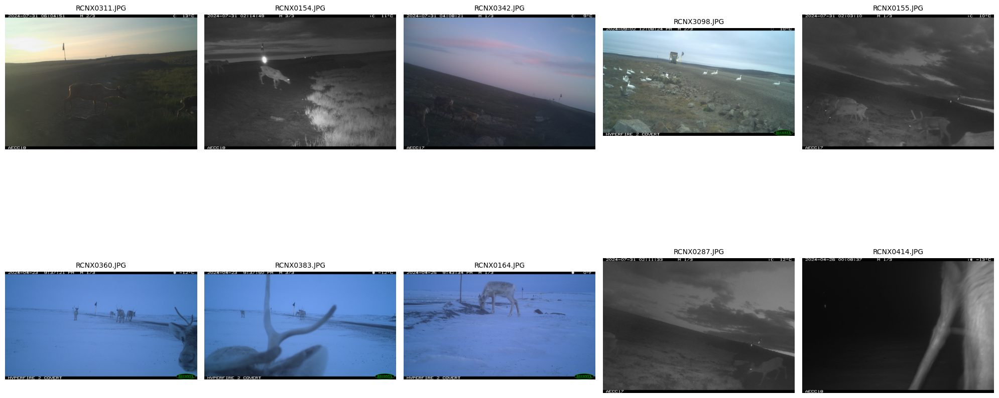


➡️ Showing images 11 to 20 ...


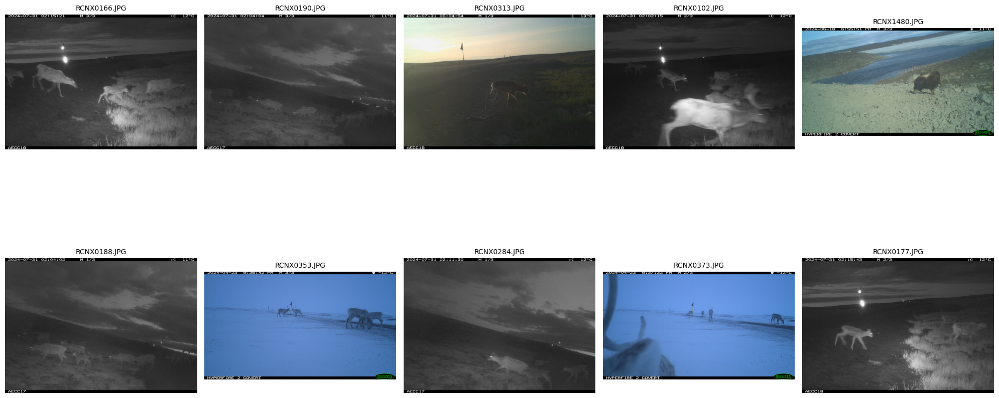


➡️ Showing images 21 to 30 ...


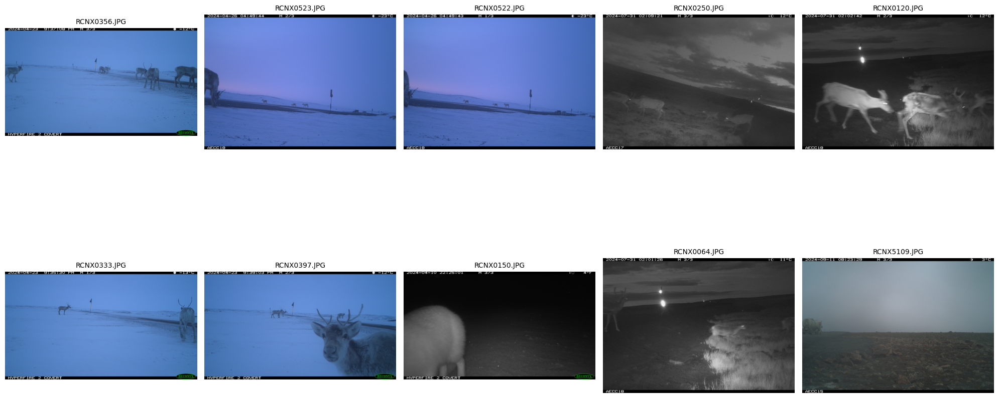


➡️ Showing images 31 to 40 ...


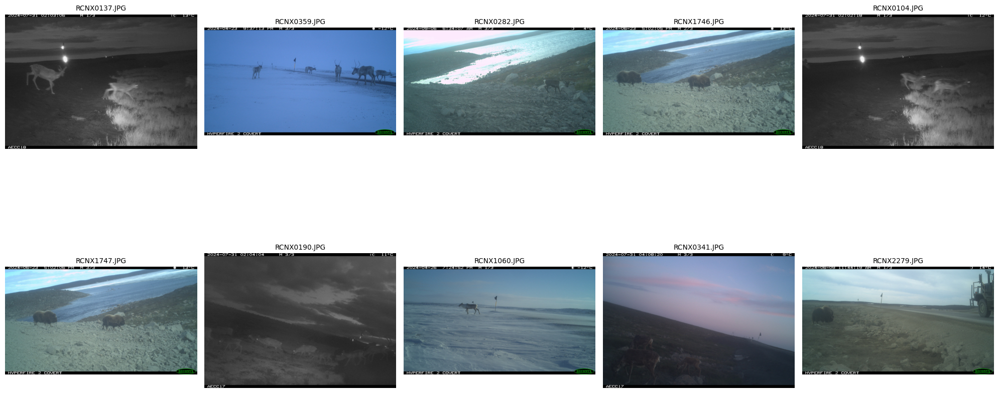


➡️ Showing images 41 to 50 ...


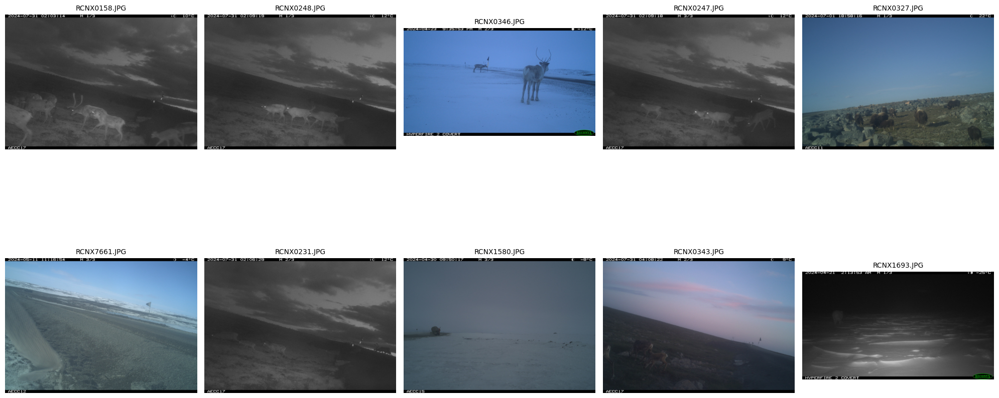


➡️ Showing images 51 to 60 ...


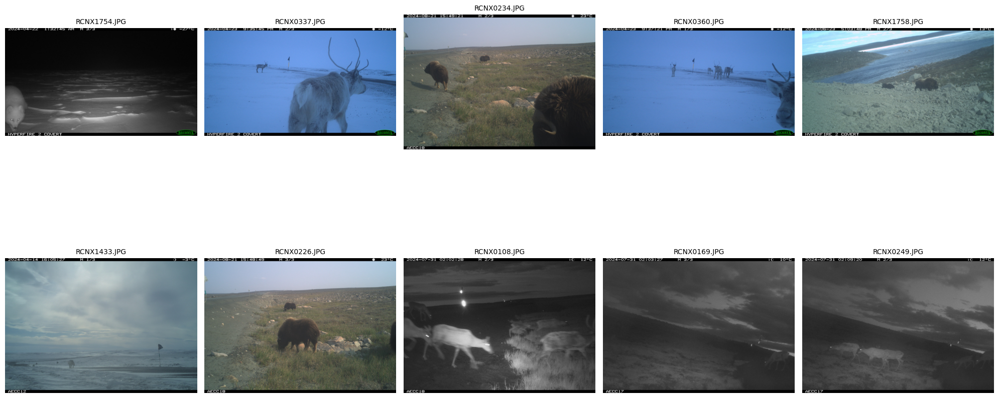


➡️ Showing images 61 to 70 ...


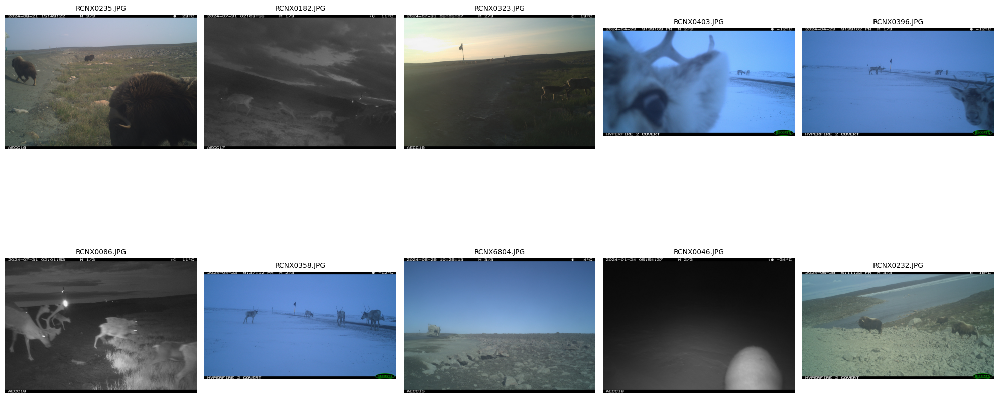


➡️ Showing images 71 to 80 ...


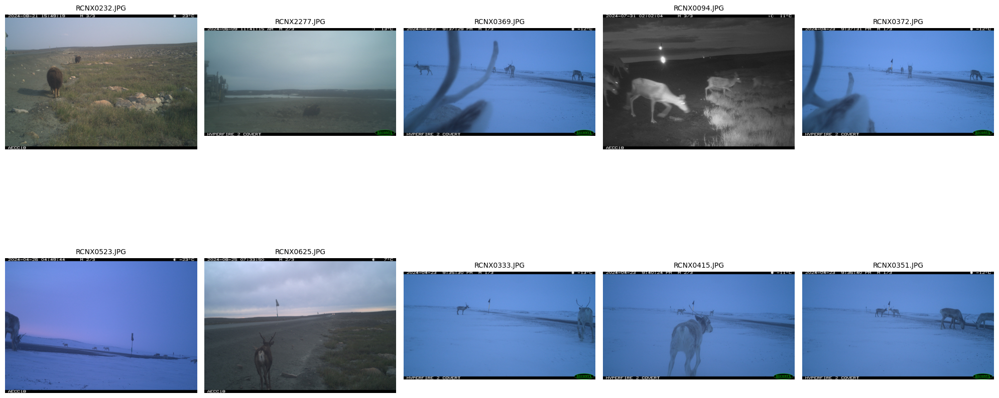


➡️ Showing images 81 to 90 ...


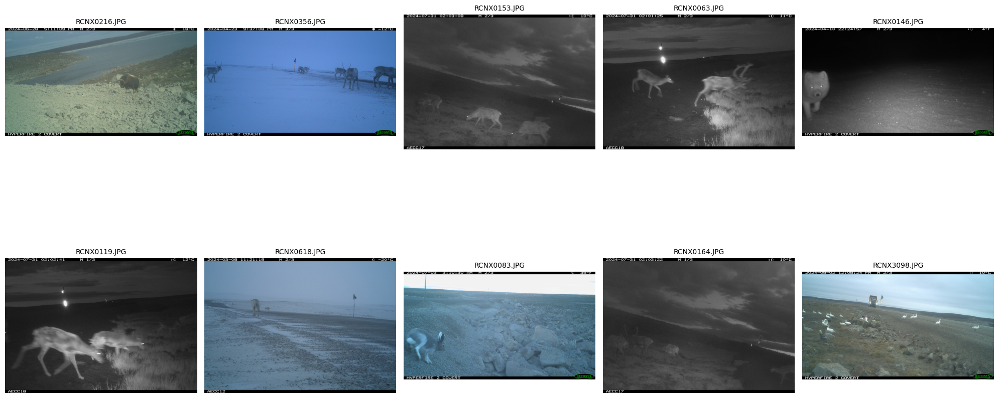


➡️ Showing images 91 to 100 ...


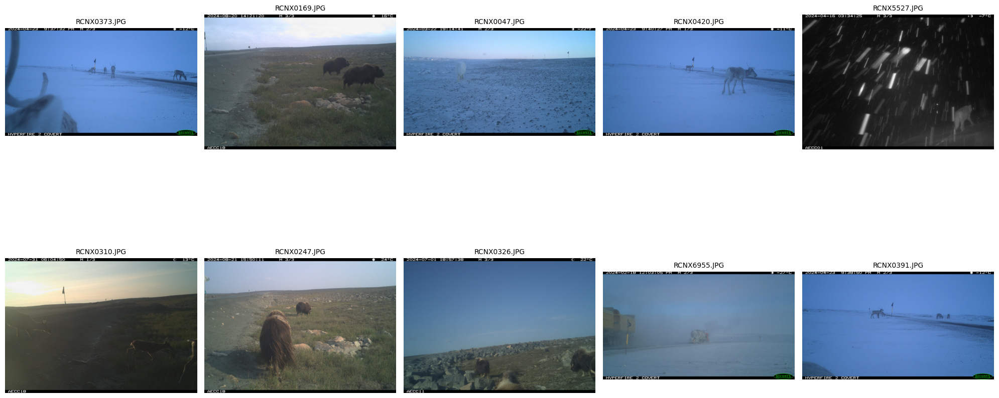

In [0]:
# show images with 100 images per batch, for accessing model precision
image_list = [r.image_path for r in df_very_confident_no_camera4.select("image_path").collect()]

# Randomly pick 100 images
sampled_images = random.sample(image_list, min(100, len(image_list)))

# show image in batches for quick validation
show_images_in_batches(sampled_images)

In [0]:
#union with df_animal on image_path

# Select only image_path from both DataFrames
df_animal_paths = df_animal.select("image_path")
df_event_paths = df_event_expanded.withColumnRenamed("related_image_path", "image_path").select("image_path")

df_animal_total = df_animal_paths.union(df_event_paths).distinct()

#count distinct animal images
distinct_count = df_animal_total.select(countDistinct(col("image_path"))).collect()[0][0]

print(distinct_count)


43362


In [0]:
# Full Outer Join to keep All rows from both df5a_final and df9c_final
df = (
    a.join(
        b,
        on=["image_path", "category"],
        how="full"
    )
)

#get bbox, conf of all the images in df_animal_total
df_animal_final=df_animal_total.join(df, on="image_path", how="inner")

#count distinct of image_path in df_animal_final
#df_animal_final.select(countDistinct(col("image_path"))).collect()[0][0]

In [0]:
df_animal_final.select(countDistinct(col("image_path"))).collect()[0][0]

24223